In [132]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import warnings
import altair as alt
warnings.filterwarnings('ignore')
import os

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
import nltk
nltk.download('punkt')

import networkx as nx
import itertools
import random
import folium


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/raunakadvani/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## Storyline
1. What are these jobs and Where do they come from?
    Top 5 Cities # done
    Top 5 Platforms # done
    Top 5 Titles amd counts # done
    Pie Chart of Job Results by Query
    Job Results by Query and Degree # done
    
2. How much?
    Table # done
    Geospatial of salary # done
    Correlational Plot Salary vs Experience # done
    Histogram of Salaries # done
    Histogram of Experience # done
    Pie chart of remote or not # done
    Boxplot of Salary: Remote or not, facetted by degree # done
    Grouped bar chart: salary grouped by experience, for different degrees
    Top 5 titles and their salaries # done

3. What do they look for?
    Word Cloud 1
    Word Cloud 2
    Network

In [248]:
df = pd.read_csv('../../data/job_data.csv')
df['query'] = df['query'].apply(lambda x: ' '.join(word if word == 'and' else word.title() for word in x.split()))

In [44]:
df.head(10)

,Unnamed: 0,title,company_name,location,via,description,schedule_type,salary,query,qualifications,responsibilities,benefits,degree,experience,remote
0,0,Ethereum Blockchain Developer (Remote),Ex Populus,Anywhere,Built In,Company Overview:\nEx Populus is a cutting-edg...,Full-time,NaN,Blockchain,['2-3 years of Software Development experience...,"['Design, maintain and deploy smart contracts ...",NaN,NaN,2.5,True
1,1,Blockchain Engineer,21.co,"New York, NY",Greenhouse,We are seeking a highly motivated and skilled ...,Full-time,180000.0,Blockchain,"[""Bachelor's or Master's degree in Computer Sc...","['As a Blockchain Engineer, you will be respon...",['(NYC only) Pursuant to Section 8-102 of titl...,Master's,NaN,False
2,2,Blockchain Course Instructor,Blockchain Institute of Technology,Anywhere,LinkedIn,"Are you a blockchain, cryptocurrency, NFT, Met...",Contractor,NaN,Blockchain,"['3+ years of experience in blockchain, crypto...",['Our expert technical team will provide the s...,NaN,NaN,3.0,True
3,3,Python based - Blockchain developer to join ex...,Upwork,Anywhere,Upwork,Need someone to join our existing team to spee...,Contractor,41600.0,Blockchain,"['Candidates must be willing to sign, non-disc...",['Will discuss details with the selected candi...,NaN,NaN,NaN,True
4,4,Blockchain DevOps Engineer (Remote),Telnyx,United States,Startup Jobs,"About Telnyx\n\nAt Telnyx, we’re architecting ...",Full-time,NaN,Blockchain,['You are a highly motivated and experienced B...,['To build a best-in-class Filecoin (FIL) Mini...,NaN,Bachelor's,NaN,True
5,5,Ethereum Developer Remote US (Blockchain-DeFi),Turnblock.io,Anywhere,ZipRecruiter,Our client is on crypto’s cutting edge technol...,Full-time,150000.0,Blockchain,"['5+ years of development experience', 'Experi...","['As a member of an agile engineering team, yo...",['Great compensation package'],NaN,5.0,True
6,6,Social Media Marketing (Blockchain/Crypto),Bitquery,Anywhere,AngelList,• Maintain a social media calendar\n• Build Bi...,Full-time,NaN,Blockchain,['English Proficiency (Written and Speaking) w...,['Put our Bitquery updates and educational con...,['Opportunity to work & collaborate with a tru...,NaN,NaN,True
7,7,Senior Software Engineer - Blockchain Network ...,Jobot,Anywhere,Dice,"competitive salaries, stock options, company p...",Full-time,175000.0,Blockchain,['At least 5 years of experience with designin...,"['Rotating breakfast menu served daily', 'Dinn...","['Salary: $150,000 - $200,000 per year', 'Our ...",NaN,5.0,True
8,8,Blockchain Developer,Atechstar,United States,OPTnation,Requirements: Strong software development back...,Full-time,141000.0,Blockchain,['Requirements: Strong software development ba...,NaN,NaN,NaN,NaN,True
9,9,DeFi Blockchain Co-Founder,Cryptops Exchange,Anywhere,LinkedIn,Cryptops is currently looking for a Co-Founder...,Full-time,NaN,Blockchain,['Can personally invest or immediately support...,['Other decentralized derivatives exchanges re...,NaN,NaN,NaN,True


In [116]:
os.getcwd()

'/Users/raunakadvani/2023-anly503-ra1113/spring-2023-scholarship-project-ra1113/code/data_visualization'

In [253]:
selection = alt.selection_single(fields=['query'],name='Random')
color = alt.condition(selection,
                      alt.value('orangered'),
                      alt.value('lightgray'))

bar = alt.Chart(df).mark_bar().encode(
    x=alt.X('query:N', sort=alt.EncodingSortField(field='salary', order='descending')),
    y='average(salary):Q',
    color=alt.value('orangered')
).properties(
    title={
        "text": ["Average Salary by Query"],
        "subtitle": ["Data from <insert data source here>"],
        "color": "black",
        "subtitleColor": "black"
    }
).add_selection(selection
                )

bar.encoding.x.title = 'Query'
bar.encoding.y.title = 'Average Salary'


color2 = alt.condition(selection,
                      alt.Color('query:N'),
                      alt.value('lightgray'))

line1 = (alt.Chart(df)
        .mark_line()
        .encode(x=alt.X('experience:Q'),
                y=alt.Y('salary:Q', aggregate='average'),
                color=color2)
        .transform_filter(selection)
)

line1.properties(
    title={
        "text": ["Average Salary by Experience for Selected Query"],
        "subtitle": ["Data from <insert data source here>"],
        "color": "black",
        "subtitleColor": "black"
    }
)

line1.encoding.x.title = 'Experience'
line1.encoding.y.title = 'Average Salary'

bar | line1

alt.HConcatChart(...)

In [264]:


# filter out 'Anywhere' and 'United States' locations
df_filtered = df.loc[~df['location'].isin(['Anywhere', 'United States'])]

# calculate the average salary for each location
df_avg_salary = df_filtered.groupby('location')['salary'].mean().reset_index()

# sort the locations by their frequency and select the top 5
df_top_locations = df_filtered['location'].value_counts().head(5).reset_index()
df_top_locations = df_avg_salary.loc[df_avg_salary['location'].isin(df_top_locations['index'])]

# create the bar plot
bar = go.Bar(x=df_top_locations['location'], y=df_top_locations['salary'], name = '', marker=dict(color='crimson'),
             hovertemplate='City: %{x}<br>Average Salary: $%{y:,.2f}')

# set the plot layout
layout = go.Layout(
                   xaxis_title='Location',
                   yaxis_title='Average Salary (USD)',
                   yaxis=dict(tickformat='$,.0f'),
                   template='plotly_dark')

# create the figure and show the plot
fig = go.Figure(data=[bar], layout=layout)
fig.show()


fig.write_html("../../website/plots/plot-18.html")



In [262]:


# filter out 'Anywhere' and 'United States' locations
df_filtered = df.loc[~df['location'].isin(['Anywhere', 'United States'])]

# calculate the average salary for each location
df_avg_salary = df_filtered.groupby('location')['salary'].mean().reset_index()

# sort the locations by their average salary and select the top 5
df_top_locations = df_avg_salary.sort_values('salary', ascending=False).head(5)

# create the bar plot
bar = go.Bar(x=df_top_locations['location'], y=df_top_locations['salary'], 
             hovertemplate='City: %{x}<br>Average Salary: $%{y:,.2f}')

# set the plot layout
layout = go.Layout(title='Average Salary by Location (Top 5)',
                   xaxis_title='Location',
                   yaxis_title='Average Salary')

# create the figure and show the plot
fig = go.Figure(data=[bar], layout=layout)
fig.show()


In [290]:
# Filter out rows with location "Anywhere" or "United States"
df_filtered = df[~df['location'].isin(['Anywhere', 'United States'])]

# Group by location and count the number of jobs
grouped_df = df_filtered.groupby('location')['title'].count().reset_index()

# Get the top 5 locations by job count
top_5 = grouped_df.nlargest(5, 'title')

# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=top_5['location'], y=top_5['title'],
                             hovertemplate='City: %{x}<br>Number of Jobs: %{y}',
                             name='',
                             marker=dict(color='crimson'))])
fig.update_layout(
                  xaxis_title='Location', yaxis_title='Count',
                  template='plotly_dark')
fig.show()

fig.write_html("../../website/plots/plot-1.html")


In [274]:
# Group by via and count the number of jobs
grouped_df = df_filtered.groupby('via')['title'].count().reset_index()

# Get the top 5 via values by job count
top_5 = grouped_df.nlargest(5, 'title')

# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=top_5['via'], y=top_5['title'],
                             hovertemplate='Posting Site: %{x}<br>Number of Jobs: %{y}',
                             name = '',
                             marker=dict(color='crimson'))])
fig.update_layout(title='',
                  xaxis_title='Job Domain', yaxis_title='Count',
                  template='plotly_dark')
fig.show()

fig.write_html("../../website/plots/plot-2.html")


In [273]:
# Group by title and count the number of jobs
grouped_df = df_filtered.groupby('title')['location'].count().reset_index()

# Get the top 5 titles by job count
top_5 = grouped_df.nlargest(5, 'location')

# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=top_5['title'], y=top_5['location'],
                             hovertemplate='Title: %{x}<br>Number of Jobs: %{y}',
                             name = '',
                             marker=dict(color='crimson'))])
fig.update_layout(
                  xaxis_title='Job Title', yaxis_title='Count',
                  template='plotly_dark')
fig.show()

fig.write_html("../../website/plots/plot-3.html")

In [291]:
# Get the top 5 most occurring job titles
top_5_titles = df['title'].value_counts().nlargest(5).index.tolist()

# Filter the dataframe to only include the top 5 titles
df_filtered = df[df['title'].isin(top_5_titles)]

# Get the average salary for each title
grouped_df = df_filtered.groupby('title')['salary'].mean().reset_index()

# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=grouped_df['title'], y=grouped_df['salary'],
                             hovertemplate='Title: %{x}<br>Average Salary: %{y:$,.2f}',
                             name='',
                             marker=dict(color='crimson'))])
fig.update_layout(
                  xaxis_title='Job Title', yaxis_title='Average Salary (USD)',
                  template='plotly_dark')
fig.update_layout(
                  yaxis=dict(tickformat='$,.0f'),)

fig.show()

fig.write_html("../../website/plots/plot-7.html")

In [64]:
# Count the number of jobs for each query
query_counts = df['query'].value_counts()

# Create the pie chart trace
pie_trace = go.Pie(
    labels=query_counts.index.tolist(),
    values=query_counts.tolist(),
    hovertemplate='Query: %{label}<br>Count: %{value}',
    name = ""
)

# Create the layout for the pie chart
layout = go.Layout(
    title='Percentage of Job Results, by Query',
    width = 800,
    template="plotly_dark"
)

# Create the figure object
fig = go.Figure(data=[pie_trace], layout=layout)

# Facet the pie chart by the 'query' column
#fig.for_each_trace(lambda trace: trace.update(title=''))

# Display the figure
fig.show()


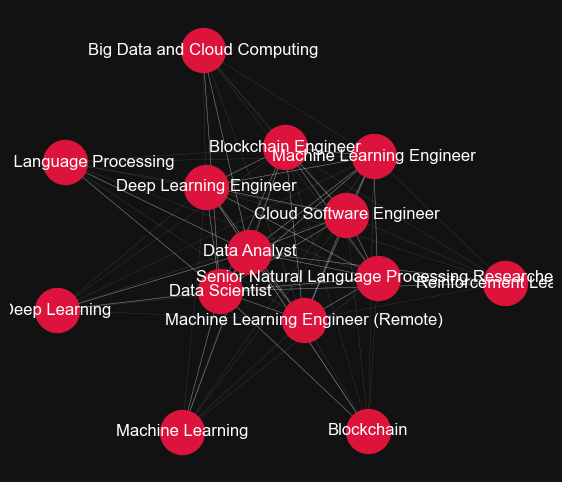

In [247]:

# create a co-occurrence matrix between job titles and queries
cooc_mat = pd.crosstab(df['title'], df['query'])

# downsample to only keep the top 10 most common queries
top_queries = cooc_mat.sum(axis=0).sort_values(ascending=False)[:8].index
cooc_mat = cooc_mat[top_queries]

# downsample to only keep the top 10 most common job titles
top_titles = cooc_mat.sum(axis=1).sort_values(ascending=False)[:8].index
cooc_mat = cooc_mat.loc[top_titles]

# create a NetworkX graph object
G = nx.Graph()

# add nodes for each job title and query
G.add_nodes_from(top_titles, bipartite=0)
G.add_nodes_from(top_queries, bipartite=1)

# add edges between job titles and queries based on the co-occurrence matrix
edges = [(title, query, cooc_mat.loc[title, query]) for title in top_titles for query in top_queries]
G.add_weighted_edges_from(edges)

# project the graph onto the job titles nodes to create a job title co-occurrence network
P = nx.bipartite.weighted_projected_graph(G, top_titles)

# create a layout for the nodes in the job title co-occurrence network
pos = nx.spring_layout(P, seed=42)

# set the plot style and settings
plt.style.use('dark_background')
#plt.rcParams['text.color'] = 'white'
plt.rcParams['figure.facecolor'] = '#121212'

# draw the job title co-occurrence network
plt.figure(figsize=(7, 6))
nx.draw_networkx_nodes(P, pos, node_color='crimson', node_size=1000)
nx.draw_networkx_edges(P, pos, edge_color='white', alpha=0.5, width=[d['weight']/20 for (u,v,d) in P.edges(data=True)])
nx.draw_networkx_labels(P, pos, font_size=12, font_family='arial', font_color='white')
plt.axis('off')
#plt.show(block = False)




plt.savefig('../../website/plots/plot-17.png')

In [209]:
import mpld3
from mpld3 import plugins

In [162]:
# group the data by query and degree, and count the number of jobs
df_grouped = df.groupby(['query', 'degree']).size().reset_index(name='count')

# define the colors for each degree
colors = {'Bachelor\'s': 'rgb(31, 119, 180)', 'Master\'s': 'rgb(255, 127, 14)', 'PhD': 'rgb(44, 160, 44)'}

# create a trace for each degree
traces = []
for degree in df_grouped['degree'].unique():
    trace = go.Bar(
        x=df_grouped[df_grouped['degree'] == degree]['query'],
        y=df_grouped[df_grouped['degree'] == degree]['count'],
        name=degree,
        marker=dict(color=colors[degree]),
        hovertemplate='Query: %{x} '+ '<br>Count: %{y}'
    )
    traces.append(trace)

# set the layout for the chart
layout = go.Layout(
    barmode='group',
    template="plotly_dark",
    xaxis=dict(title='Query'),
    yaxis=dict(title='Count')
)

# create the figure object and plot it
fig = go.Figure(data=traces, layout=layout)
fig.show()

fig.write_html("../../website/plots/plot-4.html")



In [281]:

# Create a histogram using Plotly
fig = go.Figure(data=[go.Histogram(x=df['salary'], nbinsx=15, marker=dict(color='crimson'),
                                   hovertemplate='Salary Range: %{x}<br>Count: %{y}', name = '')])

# Update the layout of the figure
fig.update_layout(
                  xaxis_title='Salary (USD)', yaxis_title='Count',
                  template='plotly_dark',
                  xaxis=dict(tickformat='$,.0f')
                  )

# Show the figure
fig.show()

fig.write_html("../../website/plots/plot-5.html")

In [283]:

# Create a histogram using Plotly
fig = go.Figure(data=[go.Histogram(x=df['experience'], nbinsx=14, marker=dict(color='crimson'),
                                   hovertemplate='Experience Range: %{x} years<br>Count: %{y}', name = '')])

# Update the layout of the figure
fig.update_layout(
                  xaxis_title='Experience (Years)', yaxis_title='Count',
                  template='plotly_dark')

# Show the figure
fig.show()

fig.write_html("../../website/plots/plot-6.html")

In [279]:


# Group by state and calculate average salary
state_salaries = df.groupby('state').mean().reset_index()

# Load US states geojson data
geo_data = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'

# Create map centered on the US
map = folium.Map(location=[37, -102], zoom_start=4)

# Add heatmap layer
folium.Choropleth(
    geo_data=geo_data + '/us-states.json',
    name='choropleth',
    data=state_salaries,
    columns=['state', 'salary'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Salary by State (USD)',
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name', 'salary'],
        aliases=['State', 'Average Salary'],
        style="background-color: white; color: #333333; font-family: Arial; font-size: 12px; padding: 10px;"
    )
).add_to(map)

# Add layer control
folium.LayerControl().add_to(map)

# Show map
map

map.save("../../website/plots/plot-11.html")



In [189]:
df['company_name'].value_counts()

Booz Allen Hamilton                       17
Apple                                     10
Deloitte                                   8
Walmart                                    7
Leidos                                     7
                                          ..
Trustees of University of Pennsylvania     1
John Deere                                 1
Northwestern Mutual                        1
MCKESSON                                   1
Blockdaemon                                1
Name: company_name, Length: 221, dtype: int64

In [193]:
# Get the top 5 most occurring company names
top_5 = df['company_name'].value_counts().head(5).index.tolist()

# Get the average salary for each of the top 5 companies
for company in top_5:
    avg_salary = df[df['company_name'] == company]['salary'].mean()
    print(f"{company}: ${avg_salary:.2f}")


Booz Allen Hamilton: $136403.12
Apple: $173942.00
Deloitte: $149563.75
Walmart: $nan
Leidos: $176218.00


In [184]:
# Group by state and calculate the number of jobs
state_jobs = df.groupby('state')['title'].count().reset_index()
state_jobs.columns = ['state', 'jobs']

# Load US states geojson data
geo_data = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'

# Create map centered on the US
map = folium.Map(location=[37, -102], zoom_start=4)

# Add heatmap layer
folium.Choropleth(
    geo_data=geo_data + '/us-states.json',
    name='choropleth',
    data=state_jobs,
    columns=['state', 'jobs'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Jobs by State',
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name', 'jobs'],
        aliases=['State', 'Number of Jobs'],
        style="background-color: white; color: #333333; font-family: Arial; font-size: 12px; padding: 10px;"
    )
).add_to(map)

# Add layer control
folium.LayerControl().add_to(map)

# Show map
map

map.save("../../website/plots/plot-16.html")



In [289]:
# Define the trace for each degree
traces = []
for degree in df['degree'].unique():
    trace = go.Scatter(
        x=df[df['degree'] == degree]['experience'],
        y=df[df['degree'] == degree]['salary'],
        mode='markers',
        name=degree,
        marker=dict(size=8),
        hovertemplate='Experience Required: %{x} years<br>Salary: $%{y:,.0f}'
    )
    traces.append(trace)

layout = go.Layout(
    xaxis=dict(title='Experience (Years)'),
    yaxis=dict(title='Salary (USD)', tickformat='$,.0f'),
    template = 'plotly_dark'
)
# Create the figure object and plot it
fig = go.Figure(data=traces, layout=layout)
fig.show()

fig.write_html("../../website/plots/plot-8.html")



In [287]:

# Group the data by 'remote'
grouped_df = df.groupby('remote')

# Create the figure object
fig = go.Figure()

# Add the box traces for the remote groups
for remote, group_df in grouped_df:
    fig.add_trace(go.Box(
        y=group_df.loc[group_df['remote'] == remote, 'salary'],
        name=str(remote),
        hovertemplate = ('Max: $%{y:.2f}<br>' +
                 'Upper Fence: $%{upperfence:.2f}<br>' +
                 '75th Percentile: $%{q3:.2f}<br>' +
                 'Median: $%{median:.2f}<br>' +
                 '25th Percentile: $%{q1:.2f}<br>' +
                 'Lower Fence: $%{lowerfence:.2f}<br>' +
                 'Min: $%{min}<br>' +
                 '<extra></extra>'),
        marker_color='crimson' if remote else 'lightseagreen'))

# Create the dropdown menu options
dropdown_options = [
    {'label': 'Remote', 'value': 'remote'},
    {'label': "Bachelor's", 'value': "Bachelor's"},
    {'label': "Master's", 'value': "Master's"},
    {'label': 'PhD', 'value': 'PhD'}
]

# Define the update menu
updatemenu = go.layout.Updatemenu(
    buttons=[
        dict(label=option['label'],
             method='update',
             args=[{'y': [df.loc[(df['remote'] == True) & (df['degree'] == option['value']), 'salary'],
                           df.loc[(df['remote'] == False) & (df['degree'] == option['value']), 'salary']]},
                   {'yaxis': {'title': 'Salaries for {} Holders (USD)'.format(option['value'])}},
                   {'hovertemplate': 'Max: $%{y:.0f}<br>Upper Fence: $%{upperfence:.0f}<br>Third Quartile: $%{q3:.0f}<br>Median: $%{median:.0f}<br>First Quartile: $%{q1:.0f}<br>Lower Fence: $%{lowerfence:.0f}<br>Min: $%{min:.0f}<br>Count: %{ydata:.0f}'}])
        for option in dropdown_options[1:]
    ],
    direction='down',
    showactive=True,
    x=1.2,
    y=1.2
)

# Add the updatemenu to the layout
fig.update_layout(updatemenus=[updatemenu])

# Define the layout
fig.update_layout(
    xaxis=dict(title='Work Remotely?'),
    yaxis=dict(title='Salaries for Bachelor\'s Holders (USD)', tickformat='$,.0f'),
    template="plotly_dark"
)


# Show the figure
fig.show()

fig.write_html("../../website/plots/plot-9.html")

In [43]:
df['query'].value_counts()

blockchain                      90
natural language processing     90
big data and cloud computing    90
data analyst                    90
machine learning                90
reinforcement learning          90
neural networks                 90
deep learning                   90
data scientist                  90
time series analysis             7
time series                      6
Name: query, dtype: int64

In [15]:
alt.Chart(df).mark_bar().encode(
    alt.X('salary:Q', bin=True),
    y='count()'
)

alt.Chart(...)

In [234]:
df = pd.read_csv('../../data/job_data.csv')


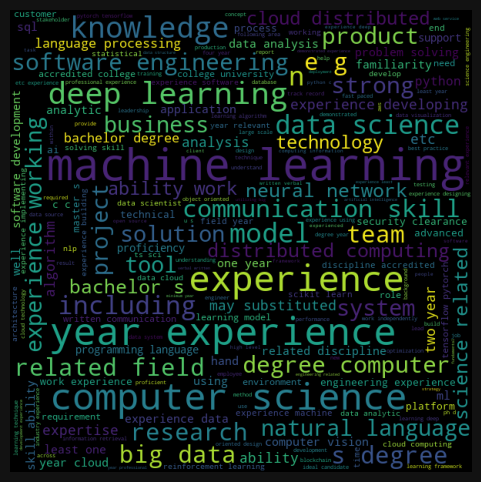

In [235]:

# drop rows with missing values in the qualifications column
df.dropna(subset=['qualifications'], inplace=True)

# tokenize, remove stop words and lemmatize the words
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

df['qualifications'] = df['qualifications'].astype(str)
df['qualifications'] = df['qualifications'].apply(lambda x: [lemmatizer.lemmatize(w.lower()) for w in word_tokenize(x) if w.lower() not in stop_words])

# create the word cloud
text = ' '.join(df['qualifications'].sum())
wordcloud = WordCloud(width=600, height=600).generate(text)

# display the word cloud
plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud) #, interpolation='bilinear')
plt.axis("off")
plt.show()

wordcloud.to_file('../../website/plots/plot-12.png')

In [236]:
df = pd.read_csv('../../data/job_data.csv')


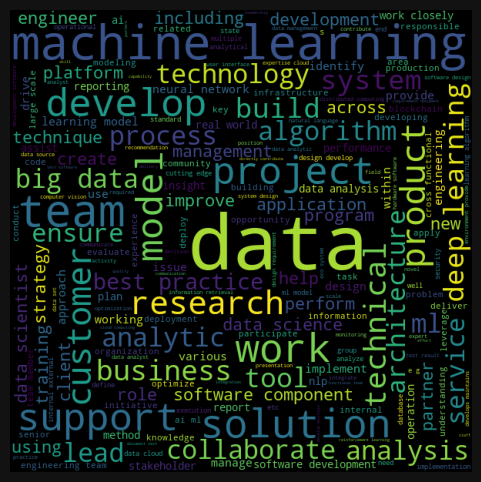

In [242]:

# drop rows with missing values in the qualifications column
df.dropna(subset=['responsibilities'], inplace=True)

# tokenize, remove stop words and lemmatize the words
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

df['responsibilities'] = df['responsibilities'].astype(str)
df['responsibilities'] = df['responsibilities'].apply(lambda x: [lemmatizer.lemmatize(w.lower()) for w in word_tokenize(x) if w.lower() not in stop_words])

# create the word cloud
text = ' '.join(df['responsibilities'].sum())
wordcloud = WordCloud(width=600, height=600).generate(text)

# display the word cloud
plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud) #, interpolation='bilinear')
plt.axis("off")
plt.show()

wordcloud.to_file('../../website/plots/plot-13.png')

In [42]:
df['title'].value_counts()

[data, analyst]                                                               22
[data, scientist]                                                             21
[machine, learning, engineer]                                                 20
[deep, learning, engineer]                                                    14
[blockchain, engineer]                                                        10
                                                                              ..
[senior, machine, learning, perception, engineer]                              1
[hewlett, packard, lab, -, machine, learning, research, scientist, ...]        1
[hewlett, packard, lab, -, machine, learning, research, associate, intern]     1
[need, expert, consult, gnns, (, graph, neural, network, ...]                  1
[natural, language, processing, engineer]                                      1
Name: title, Length: 454, dtype: int64

In [241]:
df = pd.read_csv('../../data/job_data.csv')


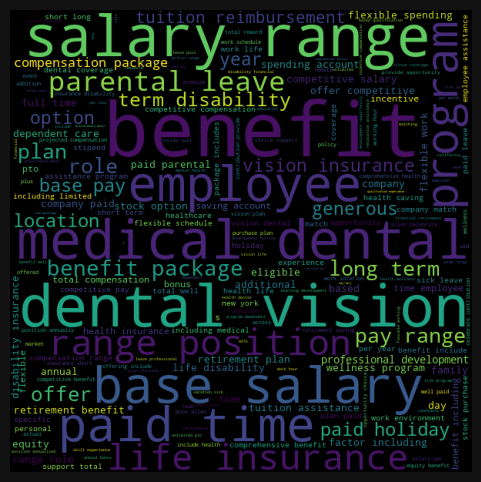

In [240]:

# drop rows with missing values in the qualifications column
df.dropna(subset=['benefits'], inplace=True)

# tokenize, remove stop words and lemmatize the words
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

df['benefits'] = df['benefits'].astype(str)
df['benefits'] = df['benefits'].apply(lambda x: [lemmatizer.lemmatize(w.lower()) for w in word_tokenize(x) if w.lower() not in stop_words])

# create the word cloud
text = ' '.join(df['benefits'].sum())
wordcloud = WordCloud(width=600, height=600).generate(text)

# display the word cloud
plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud) #, interpolation='bilinear')
plt.axis("off")
plt.show()

wordcloud.to_file('../../website/plots/plot-14.png')